# Analyse MITgcm Pine Island Glacier model output

We study the last 30 days (days 20-50)

We first process the MITgcm `.data` binary output and turn it into a time averaged netcdf

Then make plots of 

- Fig 9 - summary plot of MITgcm results

- Fig S2 - untuned simulations

- Fig S3 - surface properties of model runs

- Fig S4 - AB transect along cavity

- Fig S5 - CD transect across cavity

In [1]:
from MITgcmutils import mds
import numpy as np
import matplotlib.pyplot as plt
import cmcrameri
import cmocean as cm
import xarray as xr


First process raw data into 30 day time averages

In [2]:
dir = '/g/data/x77/cy8964/mitgcm/archive/'


In [3]:
def mean2050days(variable): #make it mean20-50days instead!
    time = 4320
    W = mds.rdmds(dir+names[i]+'/output000/'+variable, time)*0
    for j in np.arange(20,30):
        time = np.arange(4320*21,4320*30+1,4320)[j-20]
        W =W+ mds.rdmds(dir+names[i]+'/output002/'+variable, time)
    for j in np.arange(30,40):
        time = np.arange(4320*31,4320*40+1,4320)[j-30]
        W =W+ mds.rdmds(dir+names[i]+'/output003/'+variable, time)
    for j in np.arange(40,50):
        time = np.arange(4320*41,43201*50+1,4320)[j-40]
        W = W+mds.rdmds(dir+names[i]+'/output004/'+variable, time)
    return W/30

For each experiment, load data from MITgcm binary output and average over days 20-50 if necessary. Also includes some processing to work out what the surface is etc. Then save as a netcdf file.

In [5]:
names = ['original-run-R22_exe','original-run-R22_exe_tuned2','run-R22-20Aug',
         'run-R22-bigCd-20Aug','run-R22-MK18limlocal',
         'run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
for i in np.arange(len(names)):
    print(i)
    end = '/output004/'
    
    #take time averages
    M = mean2050days('SHICE_fwFluxtave')
    heat_flux = mean2050days('SHICE_heatFluxtave')
    mass = mds.rdmds(dir+names[i]+end+'shelficemassinit')
    
    if i>1:
        SS = mean2050days('shelfsnap')
        Friction_Velocity = SS[0,...]
        Viscous_Obukhov_scale = SS[3,...]
    
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    RAC = mds.rdmds(dir+names[i]+end+'RAC')
    Ts = mean2050days('Ttave')#mds.rdmds(dir+names[i]+end+'Ttave', 216000)
    Ss = mean2050days('Stave')#mds.rdmds(dir+names[i]+end+'Stave', 216000)
    hFacC = mds.rdmds(dir+names[i]+end+'hFacC')
    DRC = mds.rdmds(dir+names[i]+end+'DRC')
    Depth = np.cumsum(hFacC*DRC[-1],axis = 0)
    maxDepth = -mds.rdmds(dir+names[i]+end+'rLowC')
    minDepth = -mds.rdmds(dir+names[i]+end+'rSurfC')
    
    Ts_masked = np.where(Ts!=0,Ts,np.nan)
    Ss_masked = np.where(Ss!=0,Ss,np.nan)
    
    U = mean2050days('uVeltave')#mds.rdmds(dir+names[i]+end+'UUtave', 216000)
    V = mean2050days('vVeltave')#mds.rdmds(dir+names[i]+end+'VVtave', 216000)
    W = mean2050days('wVeltave')#mds.rdmds(dir+names[i]+end+'VVtave', 216000)
    dx =  mds.rdmds(dir+names[i]+end+'DXC')
    dy = mds.rdmds(dir+names[i]+end+'DYC')
    
    UU = mean2050days('UUtave')
    VV = mean2050days('VVtave')
    speed = np.sqrt(UU**2+VV**2)

    # work out where the surface is 
    Pressure = 9.81*1030*Depth/10000 #dbar
    thetaFreeze = Ss*-0.0575 + - 7.61e-4*Pressure+0.0901
    ThermalDriving = Ts-thetaFreeze
    ThermalDrivingmask = (Ts ==0)*10000 + np.rollaxis(np.tile(np.arange(130),(600,460,1)),2)
            
    topcells = np.argmin((ThermalDrivingmask), axis = 0)
    masktop = np.rollaxis(np.tile(np.arange(130),(600,460,1)),2) ==np.tile(topcells,(130,1,1))
    masktop = masktop*1
    ThermalDriving = (masktop*ThermalDriving).sum(axis = 0)
    ThermalDriving = ThermalDriving * (Ts[0,...] ==0)
    ThermalDriving = np.where(ThermalDriving>0,ThermalDriving,np.nan)
        
    Depthmasked = np.where((Ts !=0),np.rollaxis(np.tile(np.arange(130),(600,460,1)),2),1000000)
    #Depthmasked[0,:] = np.where(np.sum(Depthmasked,axis = 0)==np.nan,0,Depthmasked[0,:])
    topcells = (np.nanargmin((Depthmasked), axis = 0))
    #np.sum(topcells,axis = 0)
    sst = np.nansum(np.where(Depthmasked ==topcells,Ts,np.nan),axis = 0)
    sst = np.where(sst!=0,sst,np.nan)
    sss = np.nansum(np.where(Depthmasked ==topcells,Ss,np.nan),axis = 0)
    sss = np.where(sss!=0,sss,np.nan)
    if i>1:
        ds = xr.Dataset(
        data_vars=dict(
            temp=(["Z", "Y", "X"], Ts),
            salt=(["Z", "Y", "X"], Ss),
            speed=(["Z", "Y", "X"], speed),
            maxD=(["Y","X"],maxDepth),
            minD=(["Y","X"],minDepth),
            dx=(["Y","X"],dx),
            dy=(["Y","X"],dy),
            UU=(["Z", "Y", "X"], UU),
            VV=(["Z", "Y", "X"], VV),
            U=(["Z", "Y", "X"], U),
            V=(["Z", "Y", "X"], V),
            W=(["Z", "Y", "X"], W),
            ThermalDriving=(["Y","X"],ThermalDriving),
            sst=(["Y","X"],sst),
            sss=(["Y","X"],sss),
            melt=(["Y","X"],M),
            heat_flux=(["Y","X"],heat_flux),
            ice_mass=(["Y","X"],mass),
            DRC=(["k"], np.ravel(DRC)),
            hFacC=(["Z", "Y", "X"], hFacC),
            Friction_Velocity=(["Y","X"],Friction_Velocity),
            Viscous_Obukhov_scale=(["Y","X"],Viscous_Obukhov_scale),    
            XC=(["Y","X"],XC),
            YC=(["Y","X"],YC),
            RAC=(["Y","X"],RAC),
            
        ),
        attrs=dict(description="TS"),
        coords=dict(Y=("Y", YC[:,0]),
            X=("X", XC[0,:]),
            Z = ("Z",np.arange(130)*10.0),
            k = ("k", np.arange(131)
            )    ))
    else:
        ds = xr.Dataset(
        data_vars=dict(
            temp=(["Z", "Y", "X"], Ts_masked),
            salt=(["Z", "Y", "X"], Ss_masked),
            speed=(["Z", "Y", "X"], speed),
            maxD=(["Y","X"],maxDepth),
            minD=(["Y","X"],minDepth),
            dx=(["Y","X"],dx),
            dy=(["Y","X"],dy),
            UU=(["Z", "Y", "X"], UU),
            VV=(["Z", "Y", "X"], VV),
            U=(["Z", "Y", "X"], U),
            V=(["Z", "Y", "X"], V),
            W=(["Z", "Y", "X"], W),
            ThermalDriving=(["Y","X"],ThermalDriving),
            sst=(["Y","X"],sst),
            sss=(["Y","X"],sss),
            melt=(["Y","X"],M),
            heat_flux=(["Y","X"],heat_flux),
            ice_mass=(["Y","X"],mass),
            DRC=(["k"], np.ravel(DRC)),
            hFacC=(["Z", "Y", "X"], hFacC),
            XC=(["Y","X"],XC),
            YC=(["Y","X"],YC),
            RAC=(["Y","X"],RAC),
        ),
        attrs=dict(description="TS"),
        coords=dict(Y=("Y", YC[:,0]),
            X=("X", XC[0,:]),
            Z = ("Z",np.arange(130)*10.0),
            k = ("k", np.arange(131)    )))
    
    ds.temp.attrs = {'units':'degrees C','long_name':'potential temperature', 'description':'Ttave variable'}
    ds.salt.attrs = {'units':'g/kg','long_name':'salinity', 'description':'Stave variable'}
    ds.speed.attrs = {'units':'m/s','long_name':'horizontal speed from sqrt(UU**2+VV**2)'}
    ds.maxD.attrs = {'units':'m','long_name':'maximum depth'}
    ds.minD.attrs = {'units':'m','long_name':'minimum depth'}
    ds.UU.attrs = {'units':'m^2/s^2','long_name':'u velocity squared', 'description':'UUtave variable'}
    ds.VV.attrs = {'units':'m^2/s^2','long_name':'v velocity squared', 'description':'VVtave variable'}
    ds.U.attrs = {'units':'m/s','long_name':'u velocity', 'description':'uVeltave'}
    ds.V.attrs = {'units':'m/s','long_name':'v velocity', 'description':'vVeltave'}
    ds.V.attrs = {'units':'m/s','long_name':'w velocity', 'description':'wVeltave'}
    ds.ThermalDriving.attrs = {'units':'degrees C','long_name':'ice shelf thermal driving'}
    ds.sst.attrs = {'units':'degrees C','long_name':'sea surface temperature'}
    ds.sss.attrs = {'units':'g/kg','long_name':'sea surface salinity'}
    ds.melt.attrs = {'units':'kg/m^2/s','long_name':'Ice shelf fresh water flux (positive upward)','description':'SHICE_fwFluxtave variable'}
    ds.heat_flux.attrs = {'units':'W/m^2','long_name':'Ice shelf heat flux (positive upward)','description':'SHICE_heatFluxtave variable'}
    ds.ice_mass.attrs = {'units':'kg','long_name':'shelficemassinit'}
    
    ds.X.attrs={'long_name':'degrees longitude'}
    ds.Y.attrs={'long_name':'degrees latitude'}
    ds.Z.attrs={'units':'m','long_name':'depth'}
    ds.dx.attrs={'units':'m','long_name':'Cell center separation in X across western cell wall'}
    ds.dy.attrs={'units':'m','long_name':'Cell center separation in Y across southern cell wall'}
    ds.XC.attrs={'long_name':'degrees longitude'}
    ds.YC.attrs={'long_name':'degrees latitude'}
    ds.RAC.attrs={'long_name':'area', 'units':'m^2'}
    
    if i > 1:
        ds.Friction_Velocity.attrs = {'units':'m/s','long_name':'friction velocity'}
        ds.Viscous_Obukhov_scale.attrs = {'units':'','long_name':'Viscous_Obukhov_scale'}
    ds.attrs['description'] = 'Daily averaged data averaged over days 20-50 of MITgcm PIG simulation '+names[i]
    ds.to_netcdf(dir+names[i]+'/'+names[i]+'_days2050average.nc')

0
1
2
3
4
5
6


In [11]:
s_to_yr = 3600*24*365
rho0 = 1000

names = ['original-run-R22_exe','original-run-R22_exe_tuned2','run-R22-20Aug',
         'run-R22-bigCd-20Aug','run-R22-MK18limlocal',
         'run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
for i in np.arange(len(names)):
    print(i)
    melt_arr = np.zeros(50)
    dx = mds.rdmds(dir+names[i]+'/output000/'+'DXC')
    dy = mds.rdmds(dir+names[i]+'/output000/'+'DYC')
    
    for j in np.arange(10):
        time = np.arange(4320,43201,4320)[j]
        W = mds.rdmds(dir+names[i]+'/output000/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))
    for j in np.arange(10,20):
        time = np.arange(4320*11,4320*20+1,4320)[j-10]
        W = mds.rdmds(dir+names[i]+'/output001/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))
    for j in np.arange(20,30):
        time = np.arange(4320*21,4320*30+1,4320)[j-20]
        W = mds.rdmds(dir+names[i]+'/output002/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))
    for j in np.arange(30,40):
        time = np.arange(4320*31,4320*40+1,4320)[j-30]
        W = mds.rdmds(dir+names[i]+'/output003/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))
    for j in np.arange(40,50):
        time = np.arange(4320*41,43201*50+1,4320)[j-40]
        W = mds.rdmds(dir+names[i]+'/output004/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))
    
    np.savetxt('/g/data/x77/cy8964/ISOMIP/param-paper-plots/processed/PIG/'+names[i]+'melt_timeseries_daily.txt',melt_arr)

0
1
2
3
4
5
6


# Now plot

Text(0, 0.5, 'mean melt rate (m/yr)')

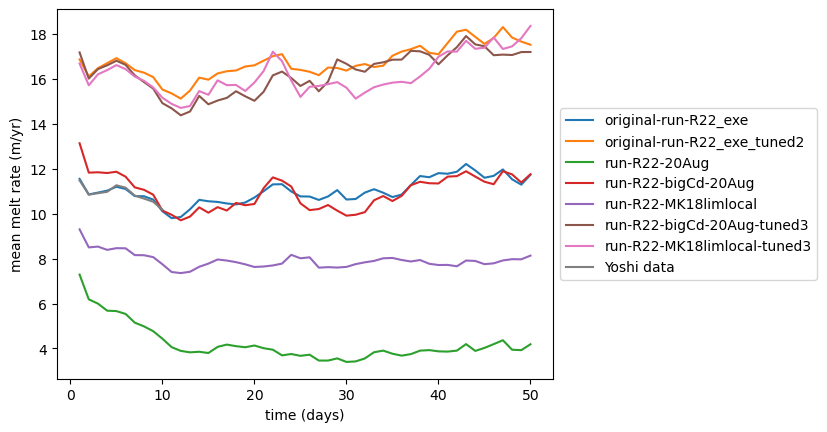

In [13]:
s_to_yr = 3600*24*365
rho0 = 1000

dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
titles = ['Original HJ99', 'R22 parameterisation', 'R22 + tuned Cd','R22 + MK18']
end = '/output001/'
#names = ['original-run','run-R22lim','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','original-run-R22_exe_tuned2','run-R22-20Aug',
         'run-R22-bigCd-20Aug','run-R22-MK18limlocal',
         'run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']

for i in np.arange(len(names)):
    melt_arr = np.loadtxt('/g/data/x77/cy8964/ISOMIP/param-paper-plots/processed/PIG/'+names[i]+'melt_timeseries_daily.txt')
    plt.plot(np.arange(4320,4320*50+1,4320)/4320,melt_arr,label = names[i])

#compare to Yoshihiro Nakayama's original control PIG simulation (which used an older executable)
dir = '/g/data/x77/cy8964/PIG/ECCO2/High_res_PIG/PIG_only_200m/latlon_run23/'
melt_arr = np.zeros(10)
for j in np.arange(10):
    time = np.arange(4320,43201,4320)[j]
    W = mds.rdmds(dir+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
    melt_arr[j] = W[W!=0].mean()
plt.plot(np.arange(4320,43201,4320)/4320,melt_arr,label = 'Yoshi data')

plt.legend(loc = 'center left', bbox_to_anchor = (1,0.5))
plt.xlabel('time (days)')
plt.ylabel('mean melt rate (m/yr)')



17.0956308690106
16.437233836024504
16.66590649016158


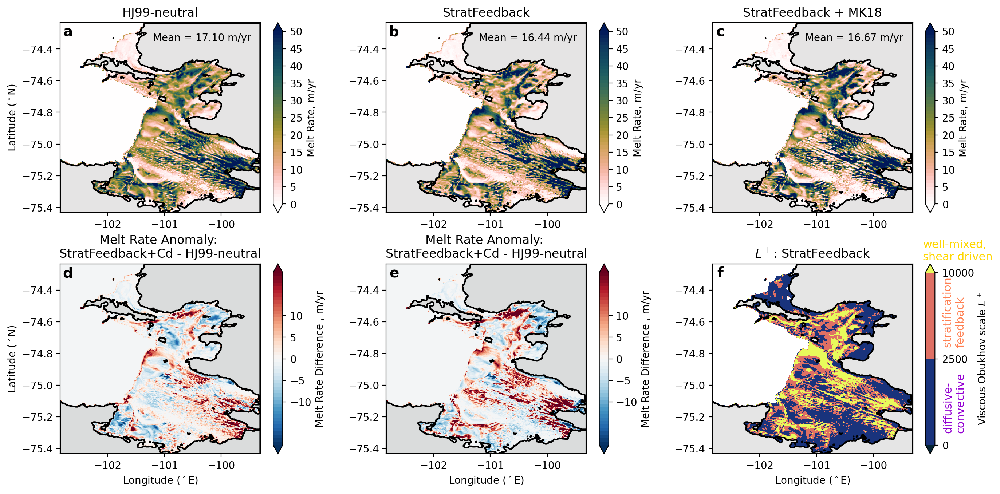

In [5]:
dir = '/g/data/x77/cy8964/mitgcm/archive/'

fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,8),dpi = 200)
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe_tuned2','run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
titles = ['HJ99-neutral', 'StratFeedback', 'StratFeedback + MK18']
end = '/output001/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

#take time averages of melt
WHJ99 = xr.open_dataset(dir+names[0]+'/'+names[0]+'_days2050average.nc').melt.values
WR22 = xr.open_dataset(dir+names[2]+'/'+names[2]+'_days2050average.nc').melt.values
WR22mk = xr.open_dataset(dir+names[1]+'/'+names[1]+'_days2050average.nc').melt.values


for i in np.arange(3):
    ds = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds.X
    YC = ds.Y
    dx = ds.dx
    dy = ds.dy
    if i ==0:
        W = WHJ99
    elif i ==1:
        W = WR22
    elif i ==2:
        W = WR22mk
    print((np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan)))*(-s_to_yr)/rho0)
    cs = axes[0,i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,50,51), cmap='cmc.batlowW_r',extend = 'both')
    plt.colorbar(cs,ax = axes[0,i],label = 'Melt Rate, m/yr', extend = 'both',ticks = np.arange(0,51,5))
    Ts = ds.temp
    axes[0,i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[0,i].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    
    axes[0,i].set_ylabel('Latitude ($^\circ$N)')
    #axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[0,i].set_title(titles[i])
    axes[0,i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)+' m/yr',)

    if i==1: #tuned R22
        # plot difference
        cs = axes[1,0].contourf(XC, YC, -s_to_yr/rho0*(WR22-WHJ99), levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[1,0],label = 'Melt Rate Difference , m/yr', extend = 'both',ticks = np.arange(-10,11,5))
        axes[1,0].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,0].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,0].set_ylabel('Latitude ($^\circ$N)')
        axes[1,0].set_xlabel('Longitude ($^\circ$E)')
        axes[1,0].set_title('Melt Rate Anomaly: \nStratFeedback+Cd - HJ99-neutral')
        #axes[1,0].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)
    if i==2: #tuned MK18
        cs = axes[1,1].contourf(XC, YC, -s_to_yr/rho0*(WR22mk-WHJ99), levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[1,1],label = 'Melt Rate Difference , m/yr', extend = 'both',ticks = np.arange(-10,11,5))
        axes[1,1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,1].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,1].set_ylabel('Latitude ($^\circ$N)')
        axes[1,1].set_xlabel('Longitude ($^\circ$E)')
        axes[1,1].set_title('Melt Rate Anomaly: \nStratFeedback+Cd - HJ99-neutral')
    if i==1:
        cs = axes[1,2].contourf(XC, YC, ds.Viscous_Obukhov_scale, levels = [0,2500,1e4], cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[1,2],label = 'Viscous Obukhov scale $L^+$', extend = 'both')
        axes[1,2].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,2].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,2].set_ylabel('Latitude ($^\circ$N)')
        axes[1,2].set_xlabel('Longitude ($^\circ$E)')
        axes[1,2].set_title('$L^+$: StratFeedback')
        
        plt.text(1.15,0.12, 'diffusive-\nconvective',rotation = 90,
        transform=axes[1,2].transAxes,color = 'darkviolet',fontsize = 11)
        plt.text(1.15,0.57, 'stratification \nfeedback',rotation = 90,
        transform=axes[1,2].transAxes,color = 'coral',fontsize = 11)
        plt.text(1.05,1.02, 'well-mixed,\nshear driven',#rotation = 90
        transform=axes[1,2].transAxes,color = 'gold',fontsize = 11)

        

        
        
#fig.suptitle('MITgcm Pine Island Glacier, time = 20 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')

axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

fig.subplots_adjust(wspace = 0.3,hspace = 0.27)
plt.show()


6.442406068655668
6.286623939623021
6.203627373369364


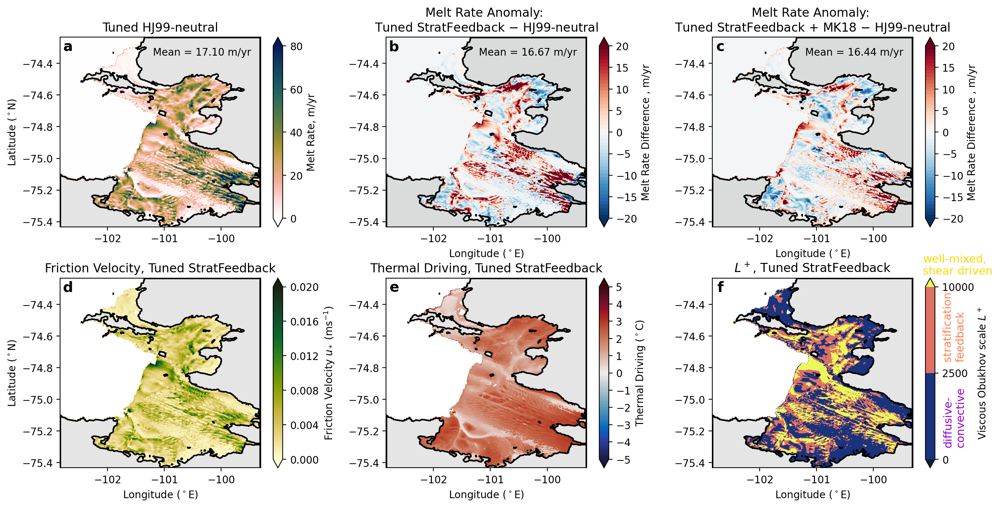

In [6]:
##!!FIG9 in paper!!

fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,8),dpi = 200)
dir = '/g/data/x77/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe_tuned2','run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
titles = ['Tuned HJ99-neutral', 'Tuned StratFeedback', 'Tuned StratFeedback + MK18']
end = '/output001/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

#take time averages of melt
WHJ99 = xr.open_dataset(dir+names[0]+'/'+names[0]+'_days2050average.nc').melt.values
WR22 = xr.open_dataset(dir+names[1]+'/'+names[1]+'_days2050average.nc').melt.values
WR22mk = xr.open_dataset(dir+names[2]+'/'+names[2]+'_days2050average.nc').melt.values


for i in np.arange(3):
    ds = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds.X
    YC = ds.Y
    dx = ds.dx
    dy = ds.dy
    if i ==0:
        W = WHJ99
        #control_sss = sss
    elif i ==1:
        W = WR22
    elif i ==2:
        W = WR22mk
    print(W.mean()*(-s_to_yr)/rho0)
    if i ==0:
        cs = axes[0,i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,80,81), cmap='cmc.batlowW_r',extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Melt Rate, m/yr', extend = 'both',ticks = np.arange(0,81,20))
        Ts = ds.temp
        axes[0,i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[0,i].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        
        axes[0,i].set_ylabel('Latitude ($^\circ$N)')
        #axes[0,i].set_xlabel('Longitude ($^\circ$E)')
        axes[0,i].set_title(titles[i])
        axes[0,i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)+' m/yr',)

    if i==1: #tuned R22
        # plot difference
        cs = axes[0,1].contourf(XC, YC, -s_to_yr/rho0*(WR22-WHJ99), levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[0,1],label = 'Melt Rate Difference , m/yr', extend = 'both',ticks = np.arange(-20,21,5))
        axes[0,1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[0,1].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[0,1].set_ylabel('Latitude ($^\circ$N)')
        axes[0,1].set_xlabel('Longitude ($^\circ$E)')
        axes[0,1].set_title('Melt Rate Anomaly: \n'+titles[i]+' $-$ HJ99-neutral')
        axes[0,1].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)+' m/yr',)
        #axes[1,0].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)
    if i==2: #tuned MK18
        #shelfsnap SSR22 has ustar, gammaT, gammaS, Lplus
        cs = axes[0,2].contourf(XC, YC, -s_to_yr/rho0*(WR22mk-WHJ99), levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[0,2],label = 'Melt Rate Difference , m/yr', extend = 'both',ticks = np.arange(-20,21,5))
        axes[0,2].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[0,2].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[0,2].set_ylabel('Latitude ($^\circ$N)')
        axes[0,2].set_xlabel('Longitude ($^\circ$E)')
        axes[0,2].set_title('Melt Rate Anomaly: \n'+titles[i]+' $-$ HJ99-neutral')
        axes[0,2].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)+' m/yr',)
    if (i==1):
        cs = axes[i,0].contourf(XC, YC, np.where(ds.Friction_Velocity!=0,ds.Friction_Velocity,np.nan), levels = np.linspace(0,2e-2,101), cmap=cm.cm.speed,extend = 'both')
        plt.colorbar(cs,ax = axes[i,0],label = 'Friction Velocity $u_*$ (ms$^{-1}$)', extend = 'both',ticks = np.arange(0,0.0201,0.004))
        axes[i,0].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[i,0].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[i,0].set_ylabel('Latitude ($^\circ$N)')
        axes[i,0].set_xlabel('Longitude ($^\circ$E)')
        axes[i,0].set_title('Friction Velocity, '+titles[i])
        
        cs = axes[i,2].contourf(XC, YC, ds.Viscous_Obukhov_scale, levels = [0,2500,1e4], cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[i,2],label = 'Viscous Obukhov scale $L^+$', extend = 'both')
        axes[i,2].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[i,2].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[i,2].set_ylabel('Latitude ($^\circ$N)')
        axes[i,2].set_xlabel('Longitude ($^\circ$E)')
        axes[i,2].set_title('$L^+$, '+titles[i])
        
        plt.text(1.15,0.12, 'diffusive-\nconvective',rotation = 90,
        transform=axes[i,2].transAxes,color = 'darkviolet',fontsize = 11)
        plt.text(1.15,0.57, 'stratification \nfeedback',rotation = 90,
        transform=axes[i,2].transAxes,color = 'coral',fontsize = 11)
        plt.text(1.05,1.02, 'well-mixed,\nshear driven',#rotation = 90
        transform=axes[i,2].transAxes,color = 'gold',fontsize = 11)
    if  (i==1):

        cs = axes[i,1].contourf(XC, YC, ds.ThermalDriving, levels = np.linspace(-5,5,101),cmap=cm.cm.balance, extend = 'both')
        
        plt.colorbar(cs,ax = axes[i,1],label = 'Thermal Driving ($^\circ$C)', extend = 'both', ticks = np.arange(-5,5.1,1))
        axes[i,1].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[i,1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[i,1].set_ylabel('Latitude ($^\circ$N)')
        axes[i,1].set_xlabel('Longitude ($^\circ$E)')
        axes[i,1].set_title('Thermal Driving, '+titles[i])


fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')

axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

fig.subplots_adjust(wspace = 0.3,hspace = 0.27)
plt.show()

fig.savefig('/g/data/x77/cy8964/ISOMIP/param-paper-plots/figs/Fig9.png', dpi = 300)

# Supplementary Plots

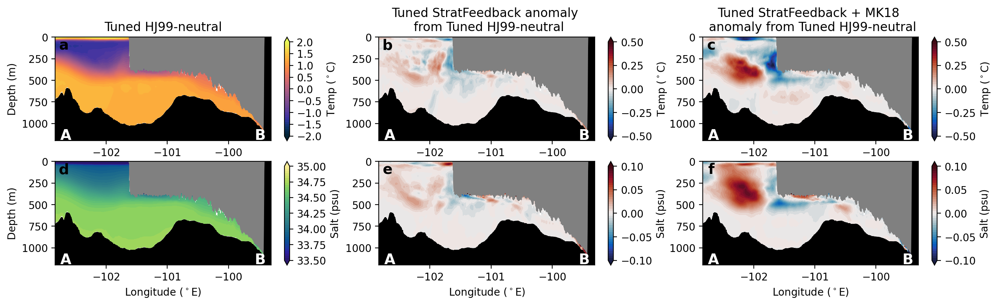

In [7]:
fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,4),dpi = 200)
dir = '/g/data/x77/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe_tuned2','run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
titles = ['Tuned HJ99-neutral', 'Tuned StratFeedback anomaly \n from Tuned HJ99-neutral', 'Tuned StratFeedback + MK18 \n anomaly from Tuned HJ99-neutral']
end = '/output004/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

lat = 200

for i in np.arange(3):
    ds = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds.X
    YC = ds.Y

    # Plot transect along N21 slices:
    
    startLat = -74.9
    startLon = np.min(XC)
    endLat = -75.3
    endLon = np.max(XC)
    n = 1000
    x = xr.DataArray(np.linspace(startLon,endLon,n), dims='along_course')
    y = xr.DataArray(np.linspace(startLat,endLat,n), dims='along_course')
    Temp_along = ds.temp.interp(X=x, Y=y, method='linear')
    Salt_along = ds.salt.interp(X=x, Y=y, method='linear')
    md_along = ds.maxD.interp(X=x, Y=y, method='linear')
    mid_along = ds.minD.interp(X=x, Y=y, method='linear')

    for j in np.arange(2):
        axes[j,i].fill_between(x,np.zeros(len(x)),mid_along,color = 'gray')
        axes[j,i].fill_between(x,np.ones(len(x))*1200,md_along,color = 'k')

    if i == 0:
        Temp_along_HJ99 = Temp_along
        Salt_along_HJ99 = Salt_along

        cs = axes[0,i].contourf(x,ds.Z,Temp_along, levels = np.linspace(-2,2,41), cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', ticks = np.arange(-2,2.1,0.5))
        cs2 = axes[1,i].contourf(x,ds.Z,Salt_along, levels = np.linspace(33.5,35,41), cmap=cm.cm.haline,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', ticks = np.arange(33.5,35.1,0.25))

    else:
        cs = axes[0,i].contourf(x,ds.Z,Temp_along-Temp_along_HJ99, levels = np.linspace(-0.5,0.5,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', ticks = np.arange(-0.5,0.6,0.25))
        cs2 = axes[1,i].contourf(x,ds.Z,Salt_along-Salt_along_HJ99, levels = np.linspace(-0.1,0.1,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both', ticks = np.arange(-0.1,0.11,0.05))
        

    if i ==0:
        axes[0,i].set_ylabel('Depth (m)')
    axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[0,i].set_title(titles[i])
    axes[0,i].set_ylim(1200,0)

    if i ==0:

        axes[1,i].set_ylabel('Depth (m)')
    axes[1,i].set_xlabel('Longitude ($^\circ$E)')
    #axes[1,i].set_title(titles[i])
    axes[1,i].set_ylim(1200,0)

axes[0,0].text(0.04,0.92,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.92,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.92,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.92,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.92,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.92,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

axes2 = axes.flatten()
for i in np.arange(6):
    axes2[i].text(0.05,0.05,'A',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    axes2[i].text(0.95,0.05,'B',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')

fig.savefig('/g/data/x77/cy8964/ISOMIP/param-paper-plots/figs/FigS4.png', dpi = 300)

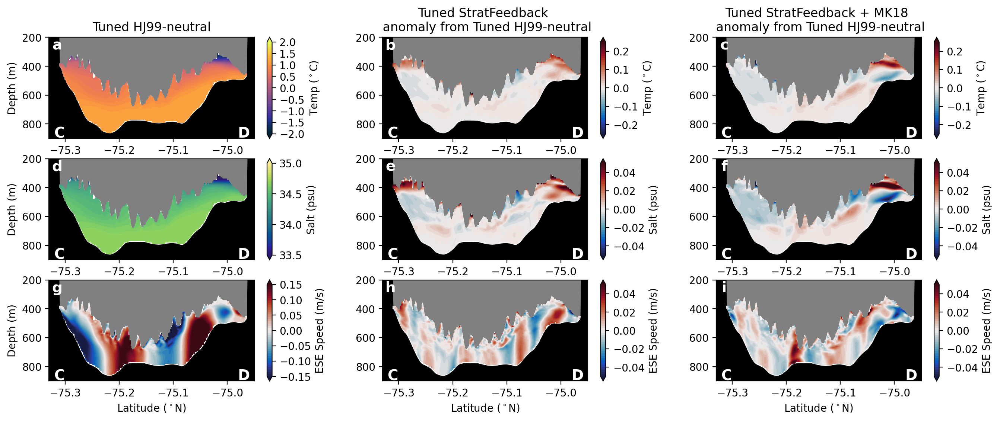

In [8]:
fig, axes  = plt.subplots(ncols = 3,nrows = 3, figsize = (16,6),dpi = 200)
dir = '/g/data/x77/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe_tuned2','run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
titles = ['Tuned HJ99-neutral', 'Tuned StratFeedback \n anomaly from Tuned HJ99-neutral','Tuned StratFeedback + MK18 \n anomaly from Tuned HJ99-neutral']
end = '/output004/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

lat = 200

for i in np.arange(3):
    ds1 = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds1.X
    YC = ds1.Y
    U = ds1.U.values
    V = ds1.V.values
    dx = ds1.dx.values
    dy = ds1.dy.values
    speed_SE = (U*dx - V*dy)/np.sqrt(dx**2+dy**2)
    speed_ESE = (U*dx + speed_SE*np.sqrt(dx**2+dy**2))/np.sqrt(2*dx**2+dy**2)
    
    speed_across = speed_ESE
    speed_masked = np.where(speed_across!=0,speed_across,np.nan)

    
    ds = xr.Dataset(
    data_vars=dict(
        temp=(["Z", "Y", "X"], ds1.temp.values),
        salt=(["Z", "Y", "X"], ds1.salt.values),
        speed=(["Z", "Y", "X"], speed_masked),
        maxD=(["Y","X"],ds1.maxD.values),
        minD=(["Y","X"],ds1.minD.values)
    ),
    attrs=dict(description="TS"),
    coords=dict(Y=("Y", YC.values),
        X=("X", XC.values),
        Z = ("Z",np.arange(130)*10)
        )

    )


    # Plot transect along N21 slices:
    
    startLat = np.min(YC)
    startLon = -100.3
    endLat = -74.9
    endLon = -99.8
    n = 1000
    x = xr.DataArray(np.linspace(startLon,endLon,n), dims='along_course')
    y = xr.DataArray(np.linspace(startLat,endLat,n), dims='along_course')
    Temp_along = ds.temp.interp(X=x, Y=y, method='linear')
    Salt_along = ds.salt.interp(X=x, Y=y, method='linear')
    speed_along = ds.speed.interp(X=x, Y=y, method='linear')
    md_along = ds.maxD.interp(X=x, Y=y, method='linear')
    mid_along = ds.minD.interp(X=x, Y=y, method='linear')

    for j in np.arange(3):
        axes[j,i].fill_between(y,np.zeros(len(y)),mid_along,color = 'gray')
        axes[j,i].fill_between(y,np.ones(len(y))*1200,md_along,color = 'k')

    if i ==0:
        cs = axes[0,i].contourf(y,ds.Z,Temp_along, levels = np.linspace(-2,2,41), cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both', ticks = np.arange(-2,2.1,0.5))
        axes[0,i].set_ylabel('Depth (m)')
        Temp_along_HJ99 = Temp_along
    else:
        cs = axes[0,i].contourf(y,ds.Z,Temp_along-Temp_along_HJ99, levels = np.linspace(-0.25,0.25,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both', ticks = np.arange(-0.2,0.21,0.1))
        
    axes[0,i].set_xlabel('Latitude ($^\circ$N)')
    axes[0,i].set_title(titles[i])
    axes[0,i].set_ylim(600,0)

    if i ==0:
        cs2 = axes[1,i].contourf(y,ds.Z,Salt_along, levels = np.linspace(33.5,35,41), cmap=cm.cm.haline,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both', ticks = np.arange(33.5,35.1,0.5))
        Salt_along_HJ99 = Salt_along
        axes[1,i].set_ylabel('Depth (m)')
    else:
        cs2 = axes[1,i].contourf(y,ds.Z,Salt_along-Salt_along_HJ99, levels = np.linspace(-0.05,0.05,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both', ticks = np.arange(-0.04,0.041,0.02))
        
    axes[1,i].set_xlabel('Latitude ($^\circ$N)')
    #axes[1,i].set_title(titles[i])

    if i ==0:
        cs2 = axes[2,i].contourf(y,ds.Z,speed_along, levels = np.linspace(-0.15,0.15,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[2,i],label = 'ESE Speed (m/s)', extend = 'both', ticks = np.arange(-0.15,0.151,0.05))
        speed_along_HJ99 = speed_along
        axes[2,i].set_ylabel('Depth (m)')
    else:
        cs2 = axes[2,i].contourf(y,ds.Z,speed_along-speed_along_HJ99, levels = np.linspace(-0.05,0.05,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[2,i],label = 'ESE Speed (m/s)', extend = 'both', ticks = np.arange(-0.04,0.041,0.02))
        
    axes[2,i].set_xlabel('Latitude ($^\circ$N)')

    
    axes[1,i].set_ylim(900,200)
    axes[0,i].set_ylim(900,200)
    axes[2,i].set_ylim(900,200)

    axes[0,i].set_xlim(-75.33,-74.95)
    axes[1,i].set_xlim(-75.33,-74.95)
    axes[2,i].set_xlim(-75.33,-74.95)
    
axes[0,0].text(0.04,0.92,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'w')
axes[0,1].text(0.04,0.92,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'w')
axes[0,2].text(0.04,0.92,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'w')
axes[1,0].text(0.04,0.92,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'w')
axes[1,1].text(0.04,0.92,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'w')
axes[1,2].text(0.04,0.92,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'w')
axes[2,0].text(0.04,0.92,'g',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,0].transAxes, fontsize = 14,color = 'w')
axes[2,1].text(0.04,0.92,'h',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,1].transAxes, fontsize = 14,color = 'w')
axes[2,2].text(0.04,0.92,'i',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,2].transAxes, fontsize = 14,color = 'w')

axes2 = axes.flatten()
for i in np.arange(9):
    axes2[i].text(0.05,0.05,'C',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    axes2[i].text(0.95,0.05,'D',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    
fig.subplots_adjust(wspace = 0.3)

fig.savefig('/g/data/x77/cy8964/ISOMIP/param-paper-plots/figs/FigS5.png', dpi = 300)

/jobfs/145770218.gadi-pbs/ipykernel_3882802/993276941.py:25: RuntimeWarning: Mean of empty slice
  speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)
/jobfs/145770218.gadi-pbs/ipykernel_3882802/993276941.py:25: RuntimeWarning: Mean of empty slice
  speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)
/jobfs/145770218.gadi-pbs/ipykernel_3882802/993276941.py:25: RuntimeWarning: Mean of empty slice
  speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)


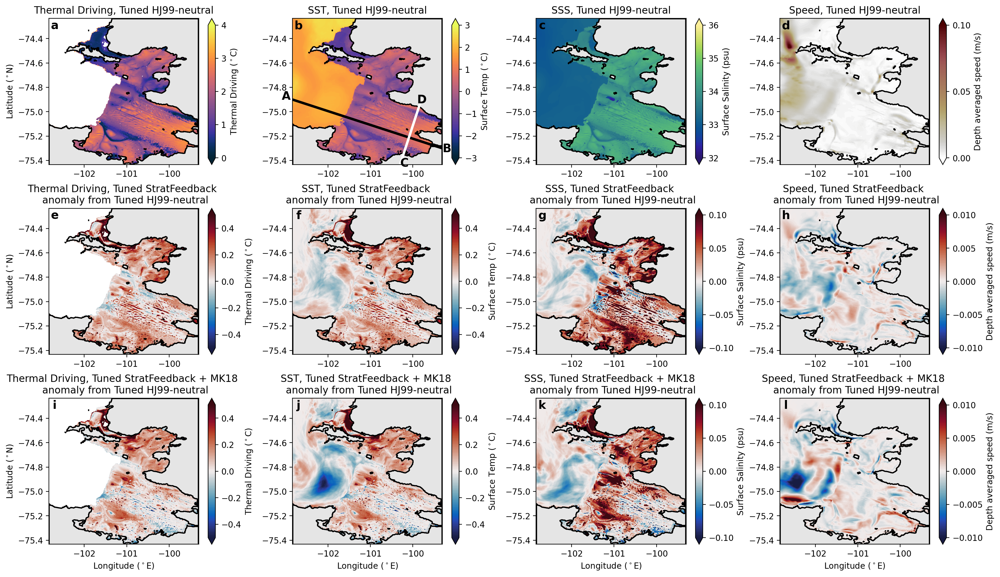

In [9]:
## supp figure

# Plot for control and tuned R22, thermal driving, surf temp, surf salinity, depth averaged KE

fig, axes  = plt.subplots(ncols = 4,nrows = 3, figsize = (20,12),dpi = 200)
dir = '/g/data/x77/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe_tuned2','run-R22-bigCd-20Aug-tuned3','run-R22-MK18limlocal-tuned3']
titles = ['Tuned HJ99-neutral', 'Tuned StratFeedback \n anomaly from Tuned HJ99-neutral',
         'Tuned StratFeedback + MK18 \n anomaly from Tuned HJ99-neutral']
end = '/output000/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

for i in np.arange(3):
    ds = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds.X
    YC = ds.Y
    dx = ds.dx
    dy = ds.dy
    Salt = ds.salt
    Temp = ds.temp
    speed = ds.speed
    speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)
    ThermalDriving = ds.ThermalDriving

    sst = ds.sst
    sss = ds.sss
    
    T = Temp

    if i==0:
        cs = axes[i,0].contourf(XC, YC, ThermalDriving, levels = np.linspace(0,4,101),cmap= cm.cm.thermal, extend = 'both')
        control_TD = ThermalDriving
        plt.colorbar(cs,ax = axes[i,0],label = 'Thermal Driving ($^\circ$C)', ticks = np.arange(0,4.1,1))
    elif (i==1) or (i==2):
        cs = axes[i,0].contourf(XC, YC, ThermalDriving-control_TD, levels = np.linspace(-0.5,0.5,101),cmap=cm.cm.balance, extend = 'both')
        
        plt.colorbar(cs,ax = axes[i,0],label = 'Thermal Driving ($^\circ$C)', ticks = np.arange(-0.4,0.41,0.2))
    axes[i,0].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,0].set_ylabel('Latitude ($^\circ$N)')
    axes[i,0].set_xlabel('Longitude ($^\circ$E)')
    axes[i,0].set_title('Thermal Driving, '+titles[i])
        
#    sst = (masktop*Temp).sum(axis = 0) *(Temp[0,...] ==0)
#    sss = (masktop*Salt).sum(axis = 0) *(Temp[0,...] ==0)

    if i==0:
        cs = axes[i,1].contourf(XC, YC, sst, levels = np.linspace(-3,3,101),cmap=cm.cm.thermal, extend = 'both')    
        control_sst = sst
        plt.colorbar(cs,ax = axes[i,1],label = 'Surface Temp ($^\circ$C)', ticks = np.arange(-3,3.1,1))
    elif (i==1) or (i==2):
        cs = axes[i,1].contourf(XC, YC, sst-control_sst, levels = np.linspace(-0.5,0.5,101),cmap=cm.cm.balance, extend = 'both')    
    #axes[i,1].contourf(XC/1000, YC/1000, Temp[0,...]*(Temp[0,...] !=0), levels = np.linspace(-3,1,101),cmap='cmc.hawaii', extend = 'both',add_colorbar = False)  
        plt.colorbar(cs,ax = axes[i,1],label = 'Surface Temp ($^\circ$C)', ticks = np.arange(-0.4,0.41,0.2))
    axes[i,1].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,1].set_ylabel('Latitude ($^\circ$N)')
    axes[i,1].set_xlabel('Longitude ($^\circ$E)')
    axes[i,1].set_title('SST, '+titles[i])

    if i==0:
        cs = axes[i,2].contourf(XC, YC, sss, levels = np.linspace(32,36,101),cmap=cm.cm.haline, extend = 'both')
        control_sss = sss
        plt.colorbar(cs,ax = axes[i,2],label = 'Surface Salinity (psu)', ticks = np.arange(32,36.1,1))
    elif (i==1) or (i==2):
        cs = axes[i,2].contourf(XC, YC, sss-control_sss, levels = np.linspace(-0.1,0.1,101),cmap=cm.cm.balance, extend = 'both')
    #axes[i,2].contourf(XC/1000, YC/1000, Salt[0,...]*(Salt[0,...] !=0), levels = np.linspace(33,36,101),cmap='cmc.imola', extend = 'both',add_colorbar = False)  
        plt.colorbar(cs,ax = axes[i,2],label = 'Surface Salinity (psu)', ticks = np.arange(-0.1,0.11,0.05))
    axes[i,2].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,2].set_ylabel('Latitude ($^\circ$N)')
    axes[i,2].set_xlabel('Longitude ($^\circ$E)')
    axes[i,2].set_title('SSS, '+titles[i])

    if i==0:
        cs = axes[i,3].contourf(XC, YC, speed, levels = np.linspace(0,0.1,101),cmap='cmc.bilbao_r', extend = 'both')
        control_speed = speed
        plt.colorbar(cs,ax = axes[i,3],label = 'Depth averaged speed (m/s)', ticks = np.arange(0,0.11,0.05))
    elif (i==1) or (i==2):
        cs = axes[i,3].contourf(XC, YC, speed-control_speed, levels = np.linspace(-0.01,0.01,101),cmap=cm.cm.balance, extend = 'both')
        
        plt.colorbar(cs,ax = axes[i,3],label = 'Depth averaged speed (m/s)', ticks = np.arange(-0.01,0.011,0.005))
    axes[i,3].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,3].set_ylabel('Latitude ($^\circ$N)')
    axes[i,3].set_xlabel('Longitude ($^\circ$E)')
    axes[i,3].set_title('Speed, '+titles[i])
    
    axes[i,0].contourf(XC, YC, np.where(np.sum(T, axis = 0)==0,np.sum(T, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    axes[i,1].contourf(XC, YC, np.where(np.sum(T, axis = 0)==0,np.sum(T, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    axes[i,2].contourf(XC, YC, np.where(np.sum(T, axis = 0)==0,np.sum(T, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    axes[i,3].contourf(XC, YC, np.where(np.sum(T, axis = 0)==0,np.sum(T, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)

        
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[0,3].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')
axes[1,3].set_ylabel('')
axes[2,1].set_ylabel('')
axes[2,2].set_ylabel('')
axes[2,3].set_ylabel('')

axes[0,0].set_xlabel('')
axes[0,1].set_xlabel('')
axes[0,2].set_xlabel('')
axes[0,3].set_xlabel('')

axes[1,0].set_xlabel('')
axes[1,1].set_xlabel('')
axes[1,2].set_xlabel('')
axes[1,3].set_xlabel('')


axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[0,3].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,3].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'g',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')
axes[1,3].text(0.04,0.95,'h',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,3].transAxes, fontsize = 14,color = 'k')
axes[2,0].text(0.04,0.95,'i',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,0].transAxes, fontsize = 14,color = 'k')
axes[2,1].text(0.04,0.95,'j',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,1].transAxes, fontsize = 14,color = 'k')
axes[2,2].text(0.04,0.95,'k',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,2].transAxes, fontsize = 14,color = 'k')
axes[2,3].text(0.04,0.95,'l',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,3].transAxes, fontsize = 14,color = 'k')

#plot lines
startLat = -74.9
startLon = np.min(XC)
endLat = -75.3
endLon = np.max(XC)
axes[0,1].plot([startLon,endLon],[startLat,endLat],color = 'k',linewidth = 3)
#plot lines
startLat = np.min(YC)
startLon = -100.3
endLat = -74.9
endLon = -99.8
axes[0,1].plot([startLon,endLon],[startLat,endLat],color = 'w',linewidth = 3)

axes[0,1].text(np.min(XC)-0.25,-74.9, 'A',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-99.3,-75.33, 'B',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-100.3,-75.45, 'C',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-99.9,-74.93, 'D',color = 'k', fontsize = 14,fontweight = 'bold')

fig.subplots_adjust(wspace = 0.3,hspace = 0.3)
plt.show()

fig.savefig('/g/data/x77/cy8964/ISOMIP/param-paper-plots/figs/FigS3.png', dpi = 300)


11.25782128876444
3.821622894543425
7.8327912850665244


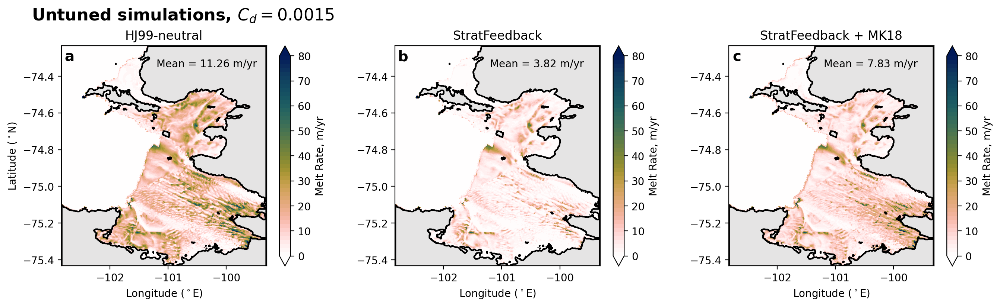

In [10]:
fig, axes  = plt.subplots(ncols = 3,nrows = 1, figsize = (16,4),dpi = 200)
dir = '/g/data/x77/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-MK18limlocal']
titles = ['HJ99-neutral', 'StratFeedback', 'StratFeedback + MK18']
end = '/output001/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

#take time averages of melt
WHJ99 = xr.open_dataset(dir+names[0]+'/'+names[0]+'_days2050average.nc').melt.values
WR22 = xr.open_dataset(dir+names[1]+'/'+names[1]+'_days2050average.nc').melt.values
WR22mk = xr.open_dataset(dir+names[2]+'/'+names[2]+'_days2050average.nc').melt.values


for i in np.arange(3):
    ds = xr.open_dataset(dir+names[i]+'/'+names[i]+'_days2050average.nc')
    XC = ds.X
    YC = ds.Y
    dx = ds.dx
    dy = ds.dy
    if i ==0:
        W = WHJ99
    elif i ==1:
        W = WR22
    elif i ==2:
        W = WR22mk
    print(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)
    cs = axes[i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,80,51), cmap='cmc.batlowW_r',extend = 'both')
    plt.colorbar(cs,ax = axes[i],label = 'Melt Rate, m/yr', extend = 'both',ticks = np.arange(0,81,10))
    Ts = ds.temp
    axes[i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[i].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    
    axes[i].set_ylabel('Latitude ($^\circ$N)')
    #axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[i].set_title(titles[i])
    axes[i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(np.nansum(np.where(W!=0,W*dx*dy,np.nan))/np.nansum(np.where(W!=0,dx*dy,np.nan))*(-s_to_yr)/rho0)+' m/yr',)

#fig.suptitle('MITgcm Pine Island Glacier, time = 20 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[1].set_ylabel('')
axes[2].set_ylabel('')

axes[0].set_xlabel('Longitude ($^\circ$E)')
axes[1].set_xlabel('Longitude ($^\circ$E)')
axes[2].set_xlabel('Longitude ($^\circ$E)')


axes[0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0].transAxes, fontsize = 14,color = 'k')
axes[1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1].transAxes, fontsize = 14,color = 'k')
axes[2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2].transAxes, fontsize = 14,color = 'k')
fig.suptitle('Untuned simulations, $C_d = 0.0015$', fontsize = 16, fontweight = 'bold',x = 0.1, ha = 'left')
fig.subplots_adjust(wspace = 0.3,hspace = 0.27)
plt.show()

fig.savefig('/g/data/x77/cy8964/ISOMIP/param-paper-plots/figs/FigS2.png', dpi = 300)

# Verirication - check channels vs keels melting

In [29]:
import scipy as sp

In [31]:

mass = ds.ice_mass
smoothed_mass = sp.ndimage.uniform_filter(mass, size=10, mode='constant')


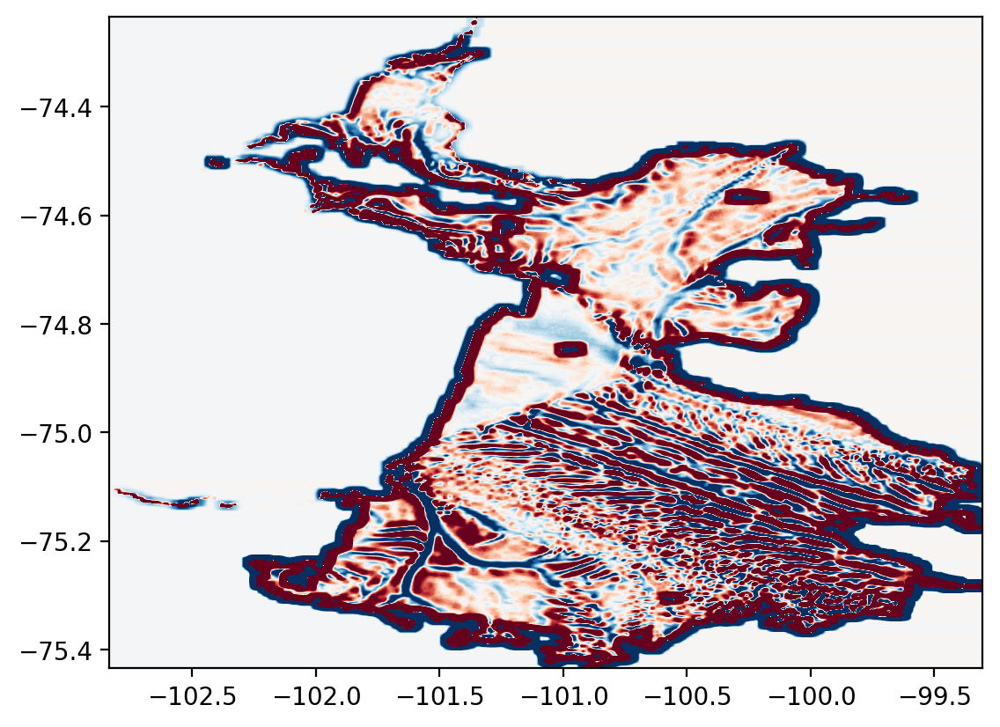

In [32]:
fig, axes  = plt.subplots(dpi = 200)
cs = axes.contourf(XC, YC, (mass-smoothed_mass)/900, levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
# channel = mass < smoothed_mass
# keel = mass > smoothed_mass (poke-y-outy bit)

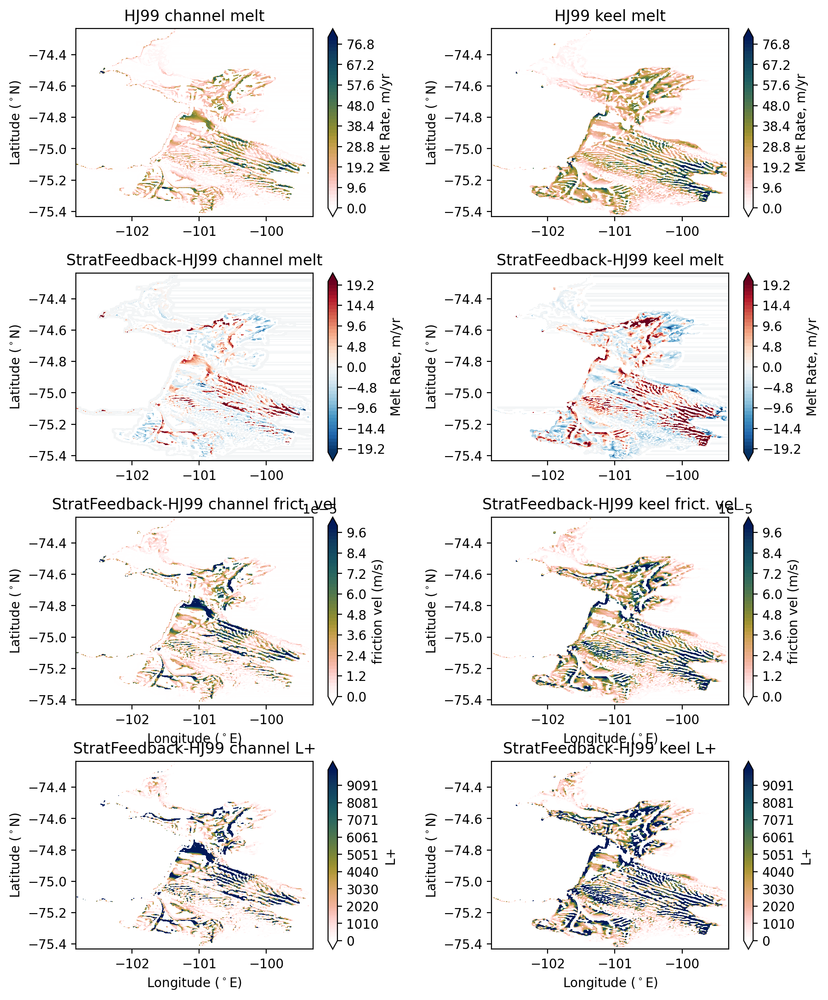

In [48]:
fig, axes  = plt.subplots(nrows = 4, ncols = 2,dpi = 200, figsize = (10,13))

melt = -s_to_yr/rho0*(WHJ99)
channel_melt = np.where(mass < smoothed_mass,melt,np.nan)
keel_melt = np.where(mass > smoothed_mass,melt,np.nan)
a = axes[0,0]
cs = a.contourf(XC, YC, channel_melt, levels = np.linspace(0,80,51), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'Melt Rate, m/yr', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('')
a.set_title('HJ99 channel melt')

a = axes[0,1]
cs = a.contourf(XC, YC, keel_melt, levels = np.linspace(0,80,51), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'Melt Rate, m/yr', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('')
a.set_title('HJ99 keel melt')

melt = -s_to_yr/rho0*(WR22-WHJ99)
channel_melt = np.where(mass < smoothed_mass,melt,np.nan)
keel_melt = np.where(mass > smoothed_mass,melt,np.nan)
a = axes[1,0]
cs = a.contourf(XC, YC, channel_melt, levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'Melt Rate, m/yr', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('')
a.set_title('StratFeedback-HJ99 channel melt')

a = axes[1,1]
cs = a.contourf(XC, YC, keel_melt, levels = np.linspace(-20,20,51), cmap='RdBu_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'Melt Rate, m/yr', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('')
a.set_title('StratFeedback-HJ99 keel melt')

frvel = SSR22cd[1,...]
channel_melt = np.where(mass < smoothed_mass,frvel,np.nan)
keel_melt = np.where(mass > smoothed_mass,frvel,np.nan)

a = axes[2,0]
cs = a.contourf(XC, YC, channel_melt, levels = np.linspace(0,0.0001,51), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'friction vel (m/s)', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('Longitude ($^\circ$E)')
a.set_title('StratFeedback-HJ99 channel frict. vel')

a = axes[2,1]
cs = a.contourf(XC, YC, keel_melt, levels = np.linspace(0,0.0001,51), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'friction vel (m/s)', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('Longitude ($^\circ$E)')
a.set_title('StratFeedback-HJ99 keel frict. vel')

lplus = SSR22cd[3,...]
channel_melt = np.where(mass < smoothed_mass,lplus,np.nan)
keel_melt = np.where(mass > smoothed_mass,lplus,np.nan)

a = axes[3,0]
cs = a.contourf(XC, YC, channel_melt, levels = np.linspace(0,1e4,100), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'L+', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('Longitude ($^\circ$E)')
a.set_title('StratFeedback-HJ99 channel L+')

a = axes[3,1]
cs = a.contourf(XC, YC, keel_melt, levels = np.linspace(0,1e4,100), cmap='cmc.batlowW_r',extend = 'both')
plt.colorbar(cs,ax = a,label = 'L+', extend = 'both')
a.set_ylabel('Latitude ($^\circ$N)')
a.set_xlabel('Longitude ($^\circ$E)')
a.set_title('StratFeedback-HJ99 keel L+')


fig.subplots_adjust(hspace = 0.3,wspace = 0.4)


# Verification - Losch layer thermal driving

SST and SSS in earlier supp plot not technically the far-field values used in melt param. Check if it matters or not.

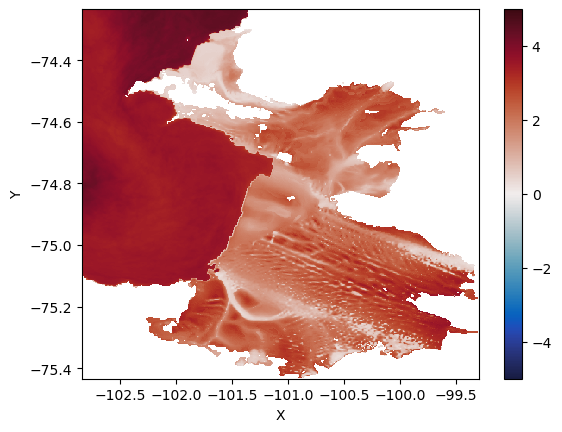

In [47]:
i = 1
end = '/output000/'
XC = ds.X
YC = ds.Y

t = ds.temp
s = ds.salt
HFacC = ds.hFacC


# #grid, tave, shelficetave, shelfsnap = open_files_MIT(0)

highest_cell = (t.where(t!=0)+(t.Z)).max('Z',skipna = True)
partial_cell_size = HFacC.where(t.Z > highest_cell).where(HFacC > 0)
Losch_thick = np.minimum(HFacC.where(t.Z > highest_cell-10).where(HFacC > 0).sum('Z'),np.ones_like(HFacC.where(t.Z > highest_cell-10).where(HFacC > 0).sum('Z')))
difference = Losch_thick - partial_cell_size.sum('Z')

tsurf = t.where(t.Z > highest_cell).where(t!=0).sum('Z')
tos = ((t.where(t.Z > highest_cell).where(t!=0)*partial_cell_size).sum('Z') + \
    ((difference)*t.where(t.Z >= highest_cell-10).where(t.Z < highest_cell)).sum('Z') )/Losch_thick#Losch Layer

ssurf = s.where(s.Z > highest_cell).where(s!=0).sum('Z')
sos = ((s.where(s.Z > highest_cell).where(s!=0)*partial_cell_size).sum('Z') + \
    ((difference)*s.where(s.Z > highest_cell-10).where(s.Z < highest_cell)).sum('Z') )/Losch_thick#Losch Layer

#DRC = mds.rdmds(dir+names[i]+end+'DRC')
#Depth = np.cumsum(hFacC*DRC[-1],axis = 0)
Pressure = -9.81*1030*highest_cell/10000 #dbar
thetaFreeze = sos*-0.0575 + - 7.61e-4*Pressure+0.0901
ThermalDriving = tos-thetaFreeze

ThermalDriving.plot(cmap = cm.cm.balance, vmax = 5, vmin = -5)

Thermal driving looks the same as exisiting plot (which uses only top cell) so keep as is.